In [ ]:
%%capture
!pip install opencv-python easyocr imutils numpy pandas joblib scikit-image scikit-learn matplotlib

In [ ]:
import cv2  as cv
import easyocr
import imutils
import numpy as np
import pandas as pd
from joblib import load
from skimage.filters import threshold_local
from skimage import measure
from skimage.feature import hog
import matplotlib.pyplot as plt

In [ ]:
# Show the figures / plots inside the notebook
def show_images(images,titles=None):
    #This function is used to show image(s) with titles by sending an array of images and an array of associated titles.
    # images[0] will be drawn with the title titles[0] if exists
    # You aren't required to understand this function, use it as-is.
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images,titles):
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        a = fig.add_subplot(1,n_ims,n)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        plt.axis('off')
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show()


In [ ]:
def calculate_contour_metrics(contour1, contour2, mode):
    """
    Calculate distance metrics between two contours with flexible modes

    Modes:
    - 'x': Horizontal clustering
    - 'y': Vertical clustering
    """
    rect1_x, rect1_y, rect1_width, rect1_height = cv.boundingRect(contour1)
    rect2_x, rect2_y, rect2_width, rect2_height = cv.boundingRect(contour2)

    if mode == 'x':
        center1_x = rect1_x + rect1_width
        center1_y = rect1_y + rect1_height/2
        center2_x = rect2_x
        center2_y = rect2_y + rect2_height/2

        if center1_x > center2_x:
            center1_x = rect1_x
            center2_x = rect2_x + rect2_width

    elif mode == 'y':
        center1_x = rect1_x + rect1_width/2
        center1_y = rect1_y + rect1_height
        center2_x = rect2_x + rect2_width/2
        center2_y = rect2_y

        if center1_y > center2_y:
            center1_y = rect1_y
            center2_y = rect2_y + rect2_height

    return (abs(center1_x - center2_x), abs(center1_y - center2_y))

def agglomerative_cluster(contours, mode, threshold_distance=20, y_threshold=25):
    """
    Generic agglomerative clustering with flexible mode

    Modes:
    - 'x': Horizontal clustering
    - 'y': Vertical clustering
    """
    clustered_contours = contours

    while len(clustered_contours) > 1:
        min_distance = None
        closest_contour_indices = None

        for x in range(len(clustered_contours) - 1):
            for y in range(x + 1, len(clustered_contours)):
                horizontal_distance, vertical_distance = calculate_contour_metrics(
                    clustered_contours[x],
                    clustered_contours[y],
                    mode=mode
                )

                horizontal_condition = horizontal_distance <= 10 if mode == 'y' else True
                vertical_condition = vertical_distance <= y_threshold if mode == 'x' else True

                if (min_distance is None and vertical_condition) or \
                   (min_distance is not None and
                    (horizontal_distance if mode == 'x' else vertical_distance) < min_distance and
                    vertical_condition and horizontal_condition):
                    min_distance = horizontal_distance if mode == 'x' else vertical_distance
                    closest_contour_indices = (x, y)

        if min_distance is not None and min_distance < threshold_distance:
            index1, index2 = closest_contour_indices
            clustered_contours[index1] = np.concatenate((clustered_contours[index1], clustered_contours[index2]), axis=0)
            del clustered_contours[index2]
        else:
            break

    return clustered_contours

# Function to check if two contours intersect
def check_contours_intersection(cnt1, cnt2, x_threshold=0):
    rect1 = cv.boundingRect(cnt1)
    rect2 = cv.boundingRect(cnt2)
    rect1_x, rect1_y, rect1_width, rect1_height = rect1
    rect2_x, rect2_y, rect2_width, rect2_height = rect2

    # Check if there is no intersection in the x-direction with the given threshold
    if rect1_x + rect1_width + x_threshold < rect2_x or rect2_x + rect2_width + x_threshold < rect1_x:
        return False

    # Check for intersection in the y-direction
    return not (rect1_y + rect1_height < rect2_y or rect2_y + rect2_height < rect1_y)

# Function to merge intersecting contours
def merge_intersecting_contours(contours):
    merged_contours = []
    processed_contours = set()

    for i, current_contour in enumerate(contours):
        if i not in  processed_contours:
            merged = current_contour.copy()

            for j, comparison_contour in enumerate(contours):
                if i != j and j not in processed_contours and check_contours_intersection(current_contour, comparison_contour):
                    merged = np.concatenate((merged, comparison_contour))
                    processed_contours.add(j)

            merged_contours.append(merged)

    return merged_contours


# License Plate Detector

In [ ]:
class LicensePlateDetector:
    def __init__(self):
        """Initialize the License Plate Detector"""
        pass

    def preprocess_image(self, img):
        """Resize and crop the image"""
        image_shape= img.shape
        img = imutils.resize(img, width=1000, height=1000 * image_shape[0] // image_shape[1])

        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        gray = gray[gray.shape[0]*2//5:gray.shape[0] - 60, :]
        gray = cv.GaussianBlur(gray, (3,3), 0)

        img = img[img.shape[0]*2//5:img.shape[0] - 60, :]
        return img, gray

    def apply_black_hat_morphology(self, gray):
        """Apply black hat morphological operation"""
        rectangle_kernel = cv.getStructuringElement(cv.MORPH_RECT, (7,5))
        black_hat_image = cv.morphologyEx(gray, cv.MORPH_BLACKHAT,  rectangle_kernel)
        return black_hat_image

    def threshold_and_analyze_image(self, black_hat_image):
        """Threshold the image and calculate pixel ratio"""
        thresholded_image = black_hat_image.copy()
        thresholded_image[thresholded_image < 50] = 0
        thresholded_image[thresholded_image >= 50] = 255

        white_pixel_count = np.count_nonzero(thresholded_image == 255)
        black_pixel_count = np.count_nonzero(thresholded_image == 0)
        ratio = round(white_pixel_count / (black_pixel_count + white_pixel_count), 4)

        return thresholded_image, ratio

    def process_sobel_gradient(self, thresholded_image, ratio):
        """Process Sobel gradient and apply morphological operations"""
        # Sobel x-direction gradient
        sobel_x = cv.Sobel(thresholded_image, cv.CV_64F, 1, 0, ksize=3)
        sobel_x = np.absolute(sobel_x)
        max_gradient_value = np.max(sobel_x)
        sobel_x = 255 * ((sobel_x) / (max_gradient_value))
        sobel_x = sobel_x.astype("uint8")

        # Conditional dilation
        gradient_image = sobel_x
        if ratio < 0.0042:
            gradient_image = cv.dilate(sobel_x, None, iterations=2)

        # Closing operation
        closing_kernel = cv.getStructuringElement(cv.MORPH_RECT, (7,7))
        closed_image = cv.morphologyEx(gradient_image, cv.MORPH_CLOSE, closing_kernel)

        return closed_image

    def refine_image(self, closed_image, ratio):
        """Apply series of morphological operations to refine the image"""
        # Erosion and dilation cycles
        eroded_1 = cv.erode(closed_image, None, iterations=2)
        dilated_1 = cv.dilate(eroded_1, None, iterations=3)

        eroded_2 = cv.erode(dilated_1, None, iterations=2)
        dilated_2 = cv.dilate(eroded_2, None, iterations=3)

        # Thresholding
        dilated_2[dilated_2 < 130] = 0
        dilated_2[dilated_2 >= 130] = 255

        # Additional erosion based on ratio
        eroded_3 = cv.erode(dilated_2, None, iterations=2)
        if ratio >= 0.01:
            erosion_kernel = cv.getStructuringElement(cv.MORPH_RECT, (3,3))
            eroded_3 = cv.erode(eroded_3, erosion_kernel, iterations=2)

        # Final morphological operations
        final_dilated_image = cv.dilate(eroded_3, None, iterations=8)
        vertical_se = cv.getStructuringElement(cv.MORPH_RECT, (5,1))
        final_img = cv.dilate(final_dilated_image, vertical_se, iterations=3)

        return final_img


    def find_and_process_contours(self, final_img, img):
        """Find and process contours to extract the desired region"""
        # Find contours
        contours, _ = cv.findContours(final_img.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

        # Merge close contours
        merged_contours = agglomerative_cluster(list(contours), 'x')
        sorted_contours = sorted(merged_contours, key=cv.contourArea, reverse=True)

        # Process and crop contours
        for cnt in sorted_contours:
            area = cv.contourArea(cnt)
            _, _, w1, h1 = cv.boundingRect(cnt)

            # Filtering conditions
            if w1 > 300 or h1 >= 150:
                continue

            if 2200 < area < 17500:
                contour_perimeter = cv.arcLength(cnt, True)
                approx = cv.approxPolyDP(cnt, 0.02 * contour_perimeter, True)
                x, y, w, h = cv.boundingRect(approx)
                aspect_ratio = w / float(h)

                if 1.5 <= aspect_ratio <= 6:
                    if y == 0:
                        return img[y:y + h + 5, x:x + w]
                    else:
                        return img[y - 6:y + h + 5, x:x + w]

        return np.zeros_like(img)


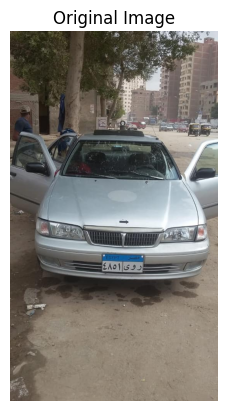

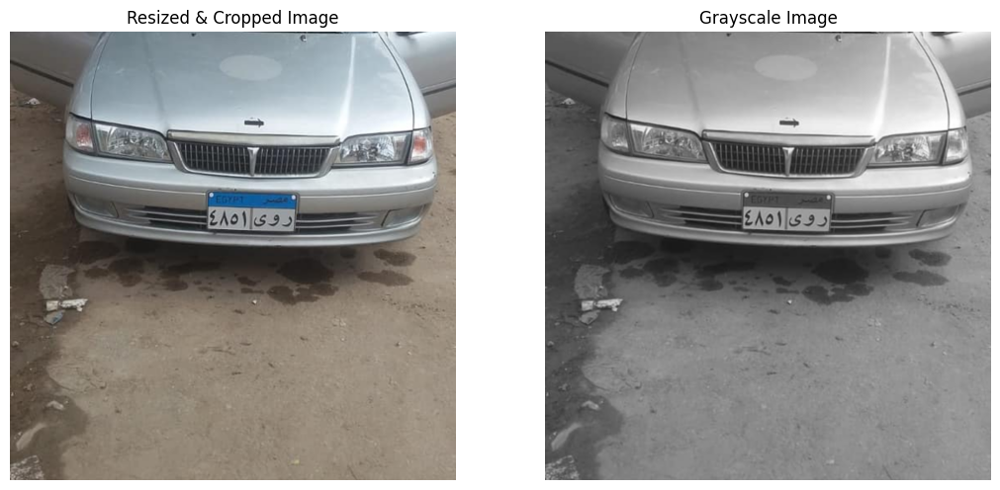

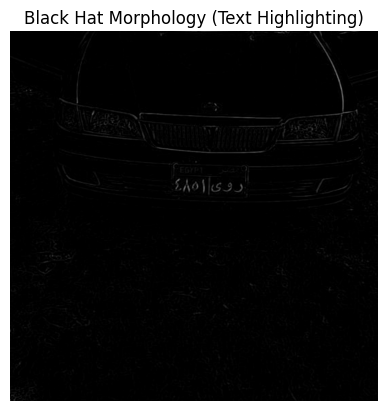

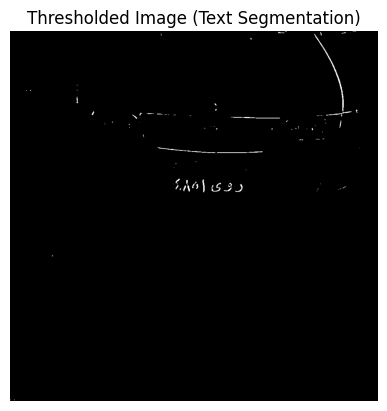

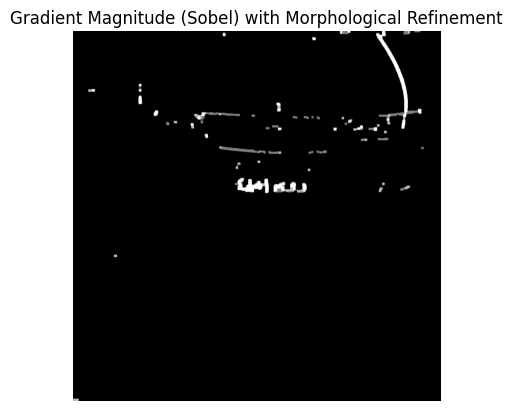

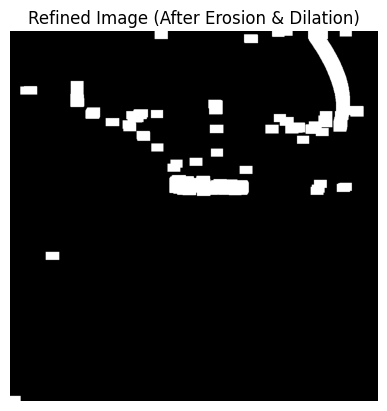

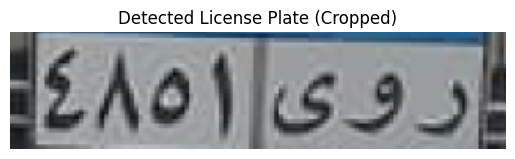

In [ ]:
def LPD(image_path):
  lpd = LicensePlateDetector()

  image_path = image_path
  image = cv.imread(image_path)

  car_image = np.array(image)
  show_images([car_image], ["Original Image"])

  # Preprocessing: Resize, crop, and grayscale conversion
  img, gray = lpd.preprocess_image(car_image)
  show_images([img, gray], ["Resized & Cropped Image", "Grayscale Image"])

  # Black hat morphology: Highlighting text-like regions
  black_hat_image = lpd.apply_black_hat_morphology(gray)
  show_images([black_hat_image], ["Black Hat Morphology (Text Highlighting)"])

  # Thresholding and ratio calculation: Segmenting the text regions and calculating pixel ratio
  thresholded_image, ratio = lpd.threshold_and_analyze_image(black_hat_image)
  show_images([thresholded_image], ["Thresholded Image (Text Segmentation)"])

  # Gradient and morphological processing: Sobel gradient and morphological refinement
  closed_image = lpd.process_sobel_gradient(thresholded_image, ratio)
  show_images([closed_image], ["Gradient Magnitude (Sobel) with Morphological Refinement"])

  # Image refinement: Erosion, dilation, and thresholding for fine-tuning
  final_img = lpd.refine_image(closed_image, ratio)
  show_images([final_img], ["Refined Image (After Erosion & Dilation)"])

  # Contour processing and cropping: Detecting and extracting the license plate region
  plate_img = lpd.find_and_process_contours(final_img, img)
  show_images([plate_img], ["Detected License Plate (Cropped)"])
  return plate_img


#################################
plate_img = LPD('0015.jpg')


# License Plate Enhancer

In [ ]:
class LicensePlateEnhancer:
    def __init__(self):
        """Initialize the License Plate Enhancer"""
        self.plate_img = None
        self.preprocessed_image = None
        self.white_mask = None
        self.black_mask = None

    def _is_validate_input(self, plate_img):
        """ Validate input image """
        return not np.all(plate_img == 0)

    def _convert_and_resize_image(self, plate_img):
        """ Convert image to HSV and resize """
        # Convert to HSV and extract value channel
        hsv_value_channel = cv.split(cv.cvtColor(plate_img, cv.COLOR_BGR2HSV))[2]

        # Invert and resize image
        preprocessed_image = cv.bitwise_not(hsv_value_channel)
        plate_img = imutils.resize(plate_img, width=200)
        preprocessed_image = imutils.resize(preprocessed_image, width=200)

        return preprocessed_image, plate_img

    def _apply_thresholding(self, thresholded_image):
        """ Apply binary thresholding to the image """
        # Binary thresholding
        thresholded_image = thresholded_image.copy()
        thresholded_image[thresholded_image < 125] = 0
        thresholded_image[thresholded_image >= 125] = 255

        # Dilation
        dilation_kernel = cv.getStructuringElement(cv.MORPH_RECT, (1,4))
        thresholded_image = cv.dilate(thresholded_image, dilation_kernel, iterations=1)

        return thresholded_image

    def _process_connected_components(self, preprocessed_image, plate_img):
        """ Process connected components and filter based on characteristics """
        # Label connected components
        labels = measure.label(preprocessed_image, background=0)
        print("Connected Components:", labels.max())
        # print("Labels: ", labels)
        # Initialize images
        self.black_mask = np.zeros(preprocessed_image.shape, dtype='uint8')
        self.white_mask = np.zeros(preprocessed_image.shape, dtype='uint8')

        # Process each labeled component
        for label in np.unique(labels):
            if label == 0:
                continue

            # Create label mask
            current_label_mask = np.zeros(preprocessed_image.shape, dtype='uint8')
            current_label_mask[labels == label] = 255

            # Find contours
            label_contours = cv.findContours(current_label_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
            label_contours = label_contours[1] if imutils.is_cv3() else label_contours[0]

            # Process contours
            if len(label_contours) > 0:
                self._filter_and_process_contour(label_contours, current_label_mask, plate_img)

        return self.black_mask

    def _filter_and_process_contour(self, label_contours, current_label_mask, plate_img):
        """ Filter contours based on specific criteria """
        # Get the largest contour
        largest_contour = max(label_contours, key=cv.contourArea)

        # Calculate contour characteristics
        (_, _, contour_width, contour_height) = cv.boundingRect(largest_contour)
        area = cv.contourArea(largest_contour)
        height_ratio = contour_height / float(plate_img.shape[0])
        width_ratio = contour_width / float(plate_img.shape[1])
        aspect_ratio = contour_width / float(contour_height)
        contour_solidity = cv.contourArea(largest_contour) / float(contour_width * contour_height)

        # Update white image
        self.white_mask = cv.bitwise_or(self.white_mask, current_label_mask)
        show_images([self.white_mask, current_label_mask ],
         ["white_mask", "current_label_mask"])

        # Apply filtering criteria
        if (area >= 15 and area < 650 and
            height_ratio < 0.9 and
            width_ratio < 0.3 and
            aspect_ratio < 2 and
            contour_solidity > 0.2 and
            contour_solidity < 0.8):
            self.black_mask = cv.bitwise_or(self.black_mask, current_label_mask)



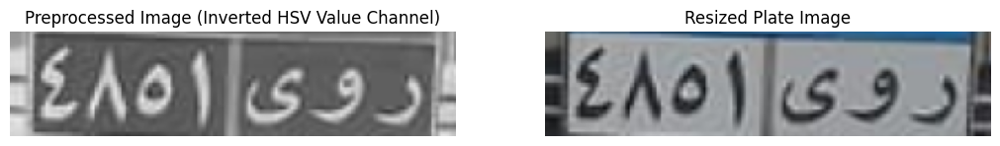

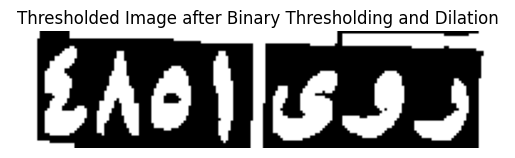

Connected Components: 10


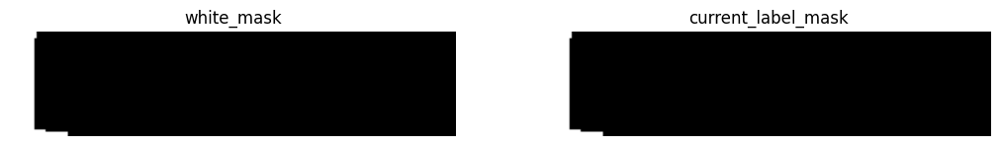

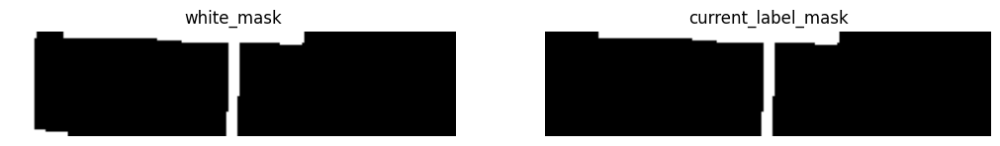

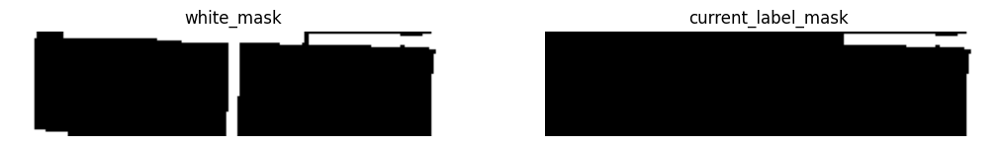

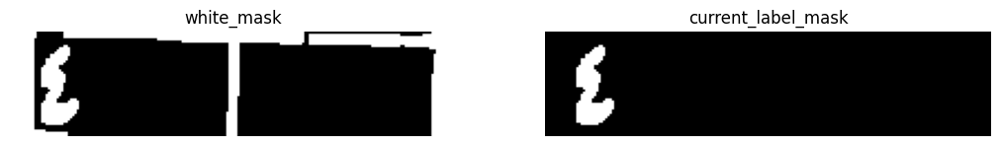

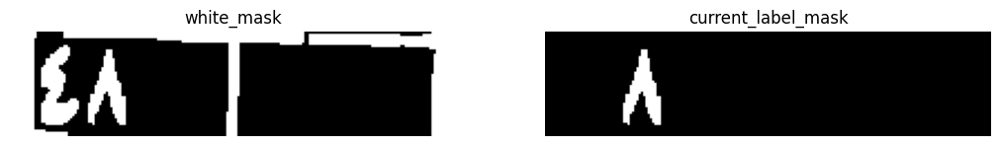

...

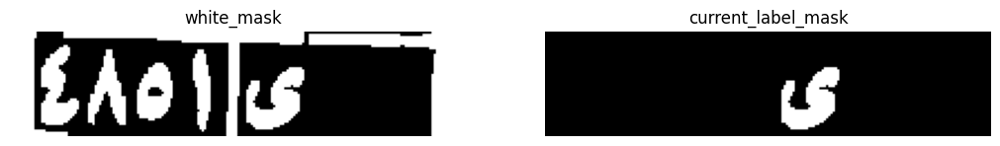

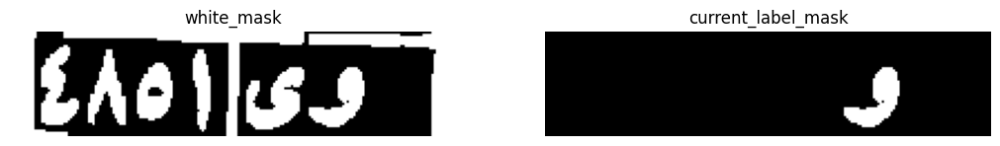

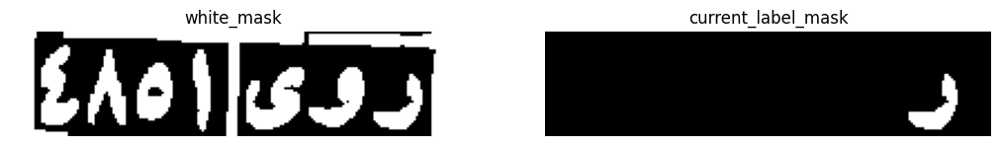

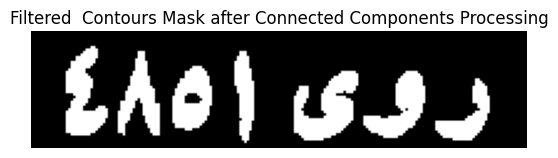

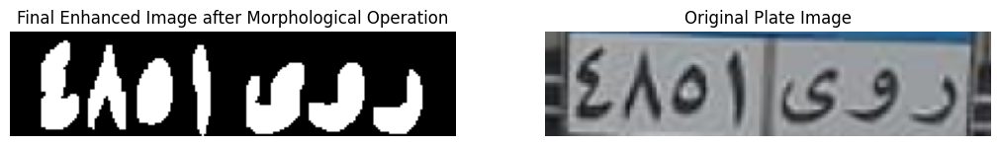

In [ ]:
# NOTE: The script for showing white and label masks can be found in _filter_and_process_contour function

def LPE(plate_img):
  enhancer = LicensePlateEnhancer()

  if not enhancer._is_validate_input(plate_img):
      print("No plate found")
  else:
      # Convert and resize image
      enhancer.preprocessed_image, enhancer.plate_img = enhancer._convert_and_resize_image(plate_img)
      show_images([enhancer.preprocessed_image, enhancer.plate_img],
                  ["Preprocessed Image (Inverted HSV Value Channel)", "Resized Plate Image"])

      # Apply thresholding
      enhancer.preprocessed_image = enhancer._apply_thresholding(enhancer.preprocessed_image)
      show_images([enhancer.preprocessed_image], ["Thresholded Image after Binary Thresholding and Dilation"])

      # Process connected components
      filtered_contours = enhancer._process_connected_components(
          enhancer.preprocessed_image,
          enhancer.plate_img
      )
      show_images([filtered_contours], ["Filtered  Contours Mask after Connected Components Processing"])

      # Final morphological operation
      morphological_kernel = cv.getStructuringElement(cv.MORPH_RECT, (1, 3))
      final_enhanced_image = cv.dilate(filtered_contours, morphological_kernel, iterations=2)
      show_images([final_enhanced_image, enhancer.plate_img],
                  ["Final Enhanced Image after Morphological Operation", "Original Plate Image"])

      return [final_enhanced_image, enhancer.plate_img]


##########################
# plate_img = LPD('0015.jpg')
[final_enhanced_image, plate_img] = LPE(plate_img)


# Character Extractor

In [ ]:
class CharExtractor:
    def __init__(self):
        self.filtered_contours = []
        self.extracted_characters = []
        self.annotated_image = None


    def preprocess_image(self, image):
        dilation_kernel = cv.getStructuringElement(cv.MORPH_RECT, (1, 3))
        return cv.dilate(image, dilation_kernel, iterations=1)

    def find_and_filter_contours(self, labels):
        for idx, label in enumerate(np.unique(labels)):
            if label == 0:
                continue

            current_label_mask = np.zeros(self.img[0].shape, dtype='uint8')
            current_label_mask[labels == label] = 255

            label_contours = cv.findContours(current_label_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
            label_contours = label_contours[1] if imutils.is_cv3() else label_contours[0]

            if len(label_contours) > 0:
                c = max(label_contours, key=cv.contourArea)
                if self.is_valid_contour(c):
                    self.filtered_contours.append(c)

        return self.filtered_contours

    def is_valid_contour(self, c):
        (contour_x, contour_y, contour_width, contour_height) = cv.boundingRect(c)
        aspect_ratio = contour_width / float(contour_height)
        contour_solidity = cv.contourArea(c) / float(contour_width * contour_height)
        area = cv.contourArea(c)

        is_valid_area = area > 70 and area < 1100
        center_line = self.img[1].shape[0] // 2

        cv.rectangle(self.annotated_image, (contour_x, contour_y), (contour_x + contour_width, contour_y + contour_height), (0, 255, 0), 1)

        return is_valid_area and contour_solidity < 0.8 and ((center_line > contour_y and center_line < contour_y + contour_height) or (center_line <= contour_y))

    def merge_and_cluster_contours(self):
        self.filtered_contours = agglomerative_cluster(self.filtered_contours, 'y')
        self.filtered_contours = merge_intersecting_contours(self.filtered_contours)
        return agglomerative_cluster(self.filtered_contours, 'x', threshold_distance=2)

    def extract_car_letters(self):
        for cnt in self.filtered_contours:
            (char_x, char_y, char_width, char_height) = cv.boundingRect(cnt)
            character_image = self.img[1].copy()[char_y:char_y + char_height, char_x:char_x + char_width]
            self.extracted_characters.append((character_image, char_x))
            cv.rectangle(self.img[1], (char_x, char_y), (char_x + char_width, char_y + char_height), (0, 255, 0), 1)

        return self.extracted_characters

    def determine_is_valid_plate(self):
        if 2 <= len(self.extracted_characters) <= 7:
            return 1
        else:
            print(len(self.extracted_characters))
            return 0


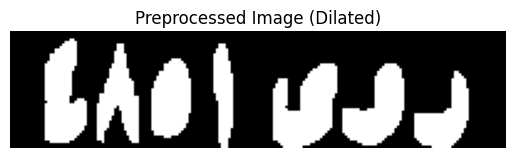

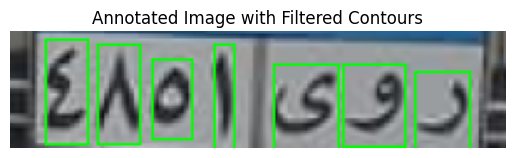

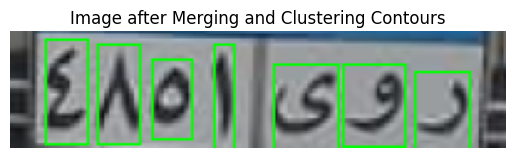

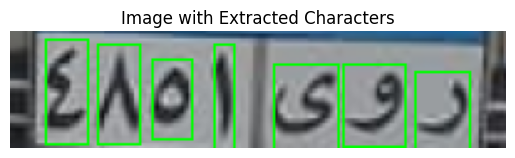

Is the plate valid? 1


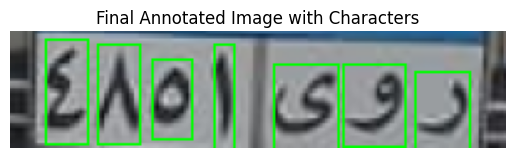

Extracted Characters: 7


In [ ]:
def extract_chars(img):
  extractor = CharExtractor()

  # Set the input image
  extractor.img = img
  extractor.annotated_image = img[1].copy()

  extractor.img[0] = extractor.preprocess_image(extractor.img[0])
  show_images([extractor.img[0]], ["Preprocessed Image (Dilated)"])

  # Find contours and filter them
  labels = measure.label(extractor.img[0], background=0)
  extractor.filtered_contours = extractor.find_and_filter_contours(labels)
  show_images([extractor.annotated_image], ["Annotated Image with Filtered Contours"])

  # Merge and cluster contours
  extractor.filtered_contours = extractor.merge_and_cluster_contours()
  show_images([extractor.annotated_image], ["Image after Merging and Clustering Contours"])

  # Extract car letters (individual characters)
  extractor.extracted_characters = extractor.extract_car_letters()
  show_images([extractor.annotated_image], ["Image with Extracted Characters"])

  # Determine if the plate is valid based on the number of extracted characters
  is_valid_plate = extractor.determine_is_valid_plate()
  print("Is the plate valid?", is_valid_plate)

  # Output the final images and results
  show_images([extractor.img[1]], ["Final Annotated Image with Characters"])
  print("Extracted Characters:", len(extractor.extracted_characters))
  return [extractor.img[1], is_valid_plate, extractor.extracted_characters]


#######################################################################
img = [final_enhanced_image, plate_img]

car_plate , flag, car_letters = extract_chars(img)



In [ ]:
def char_recognizer(car_plate, flag, car_letters):

  car_plate = np.array(car_plate)
  result = []
  if flag == 1:
      model = load("model_svm.pkl", mmap_mode="r")
      data = []
      car_letters = sorted(car_letters ,key=lambda x: x[1], reverse = True)
      for i in car_letters:
          car_image = cv.resize(i[0],(32,64))
          gray = cv.cvtColor(car_image, cv.COLOR_BGR2GRAY)
          describtor= hog(gray,orientations=9,pixels_per_cell=(8,8), cells_per_block=(1, 1))
          data.append((describtor).flatten())
      df_test = pd.DataFrame(data)
      df_test = df_test.dropna(axis=1)
      result = model.predict(df_test)
      flag = 0
      car_letters = []
  else:
    result = []
  return [car_plate,result]



#######################################################################
[car_plate, result] = char_recognizer(car_plate, flag, car_letters)

In [ ]:
result

array(["ra'", 'waw', "ya'", '1', '5', '8', '4'], dtype=object)

array([[[101, 106, 105],
        [102, 107, 106],
        [102, 107, 105],
        ...,
        [ 85,  86,  82],
        [ 73,  76,  74],
        [ 97, 101, 102]],

       [[ 99, 104, 104],
        [100, 105, 104],
        [100, 105, 104],
        ...,
        [ 79,  83,  81],
        [ 67,  72,  73],
        [ 96, 100, 104]],

       [[ 99, 104, 103],
        [100, 104, 104],
        [100, 105, 104],
        ...,
        [ 77,  82,  82],
        [ 65,  72,  73],
        [ 95, 100, 105]],

       ...,

       [[ 36,  34,  33],
        [ 38,  36,  35],
        [ 38,  36,  35],
        ...,
        [ 84,  79,  80],
        [ 88,  83,  84],
        [ 90,  85,  86]],

       [[ 42,  38,  37],
        [ 43,  39,  38],
        [ 41,  38,  37],
        ...,
        [ 56,  52,  53],
        [ 64,  60,  61],
        [ 67,  63,  64]],

       [[ 44,  40,  39],
        [ 45,  41,  40],
        [ 43,  39,  38],
        ...,
        [ 45,  43,  43],
        [ 54,  52,  52],
        [ 59,  55,  56]]], dtype=uint8)
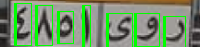

In [ ]:
car_plate

# Test all

In [ ]:
def run_all(image_path):
  plate_img = LPD(image_path)
  [final_enhanced_image, plate_img] = LPE(plate_img)
  img = [final_enhanced_image, plate_img]
  car_plate , flag, car_letters = extract_chars(img)
  [car_plate, result] = char_recognizer(car_plate, flag, car_letters)
  return [car_plate, result]


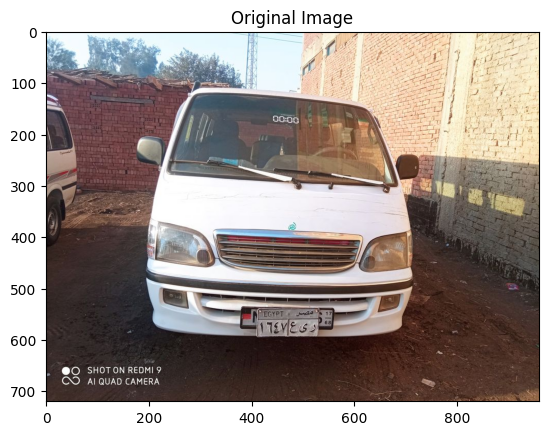

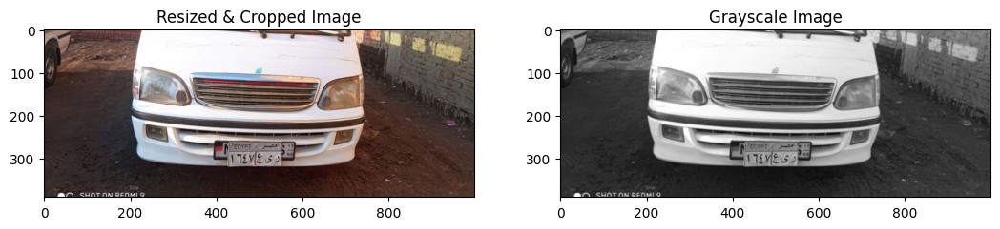

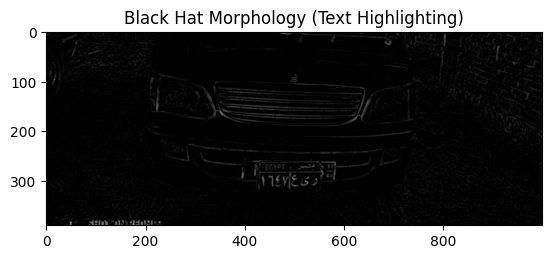

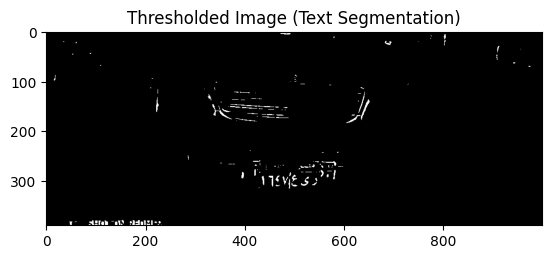

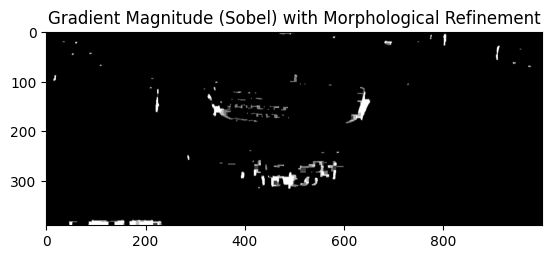

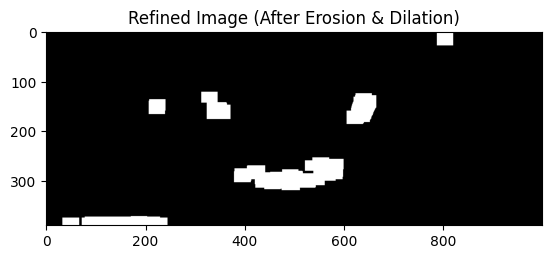

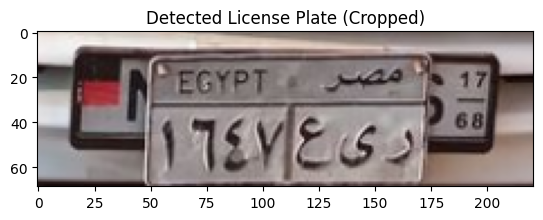

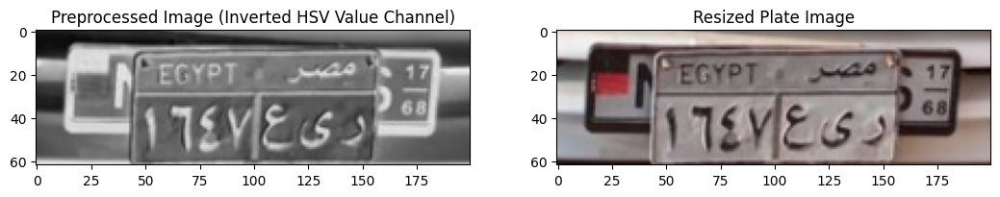

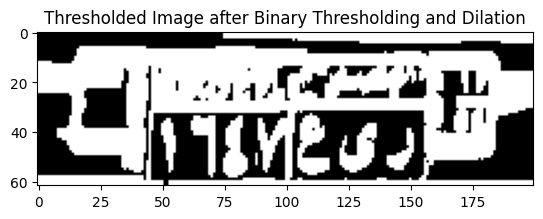

Connected Components: 9


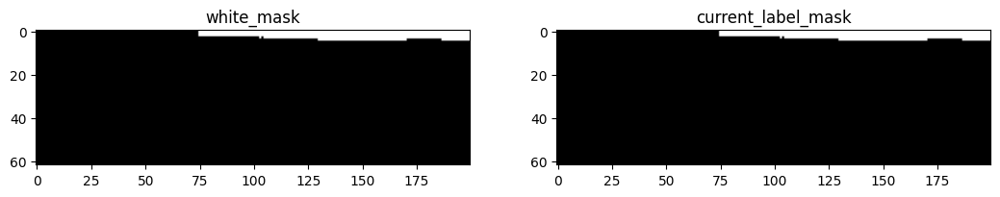

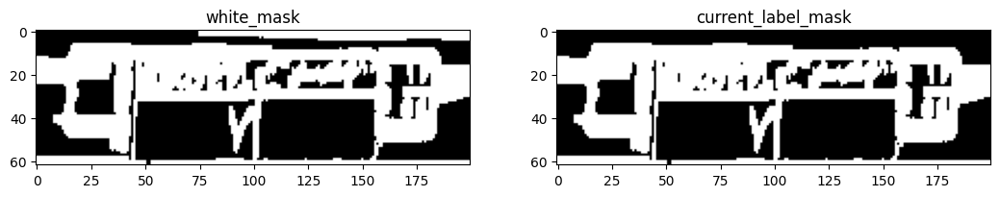

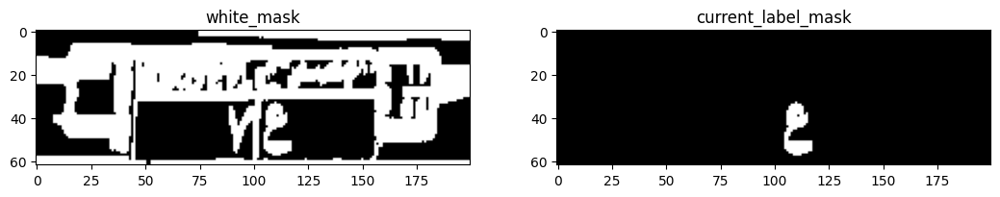

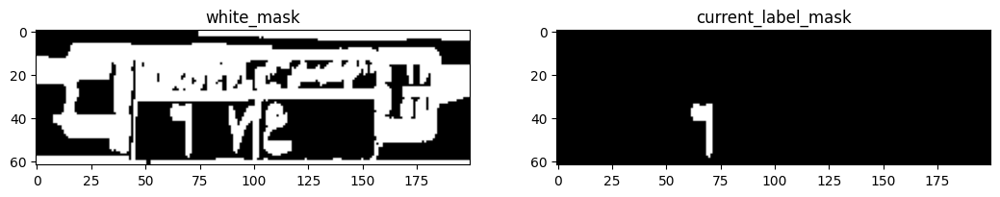

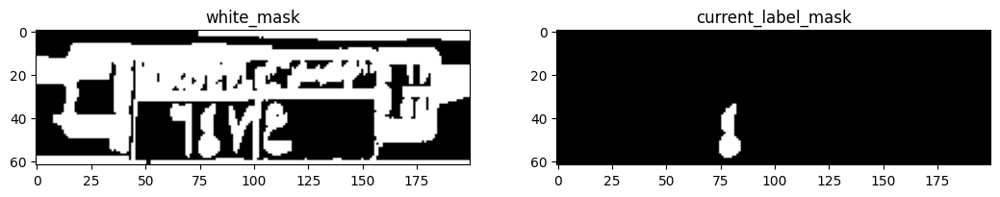

...

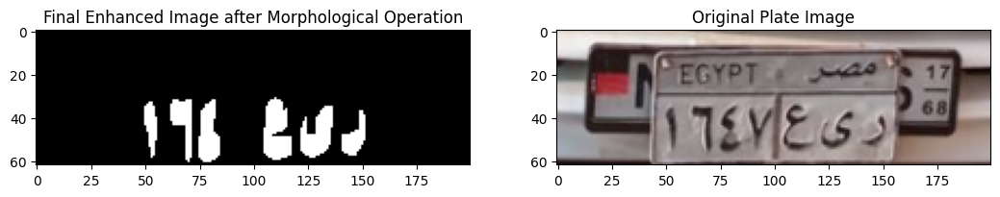

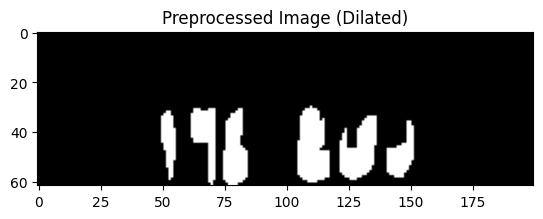

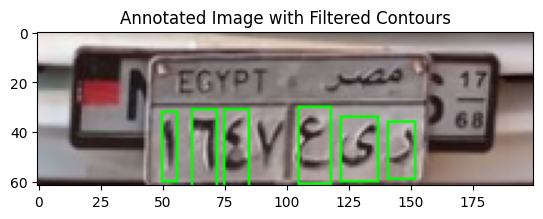

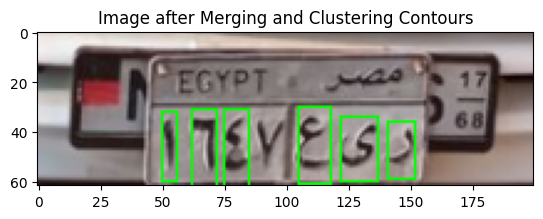

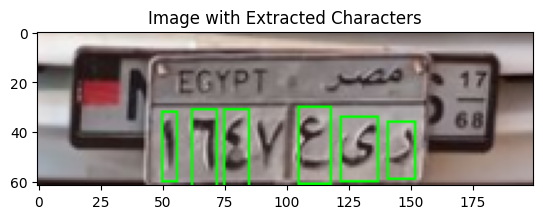

Is the plate valid? 1


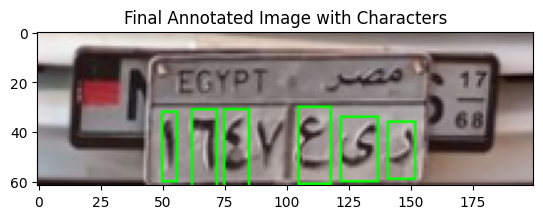

Extracted Characters: 6


In [ ]:
[car_plate, result] = run_all('0021.jpg')

Result:  ["ra'" "ya'" '4' '4' '6' '1']


array([[[207, 215, 223],
        [206, 215, 223],
        [205, 213, 222],
        ...,
        [ 94,  97, 111],
        [ 94,  97, 111],
        [ 94,  98, 109]],

       [[220, 225, 233],
        [218, 225, 232],
        [217, 223, 231],
        ...,
        [106, 108, 119],
        [106, 108, 119],
        [106, 108, 119]],

       [[228, 232, 239],
        [227, 232, 238],
        [226, 230, 237],
        ...,
        [118, 119, 129],
        [118, 118, 130],
        [117, 119, 130]],

       ...,

       [[ 98,  95, 103],
        [100,  98, 106],
        [103, 101, 109],
        ...,
        [161, 161, 177],
        [161, 161, 177],
        [161, 161, 177]],

       [[ 35,  35,  47],
        [ 37,  37,  49],
        [ 39,  38,  50],
        ...,
        [137, 137, 155],
        [136, 136, 154],
        [134, 134, 152]],

       [[ 18,  18,  30],
        [ 18,  18,  30],
        [ 17,  17,  29],
        ...,
        [ 67,  67,  85],
        [ 66,  66,  84],
        [ 63,  63,  81]]], dtype=uint8)
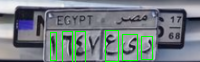

In [ ]:
print("Result: ", result)
car_plate

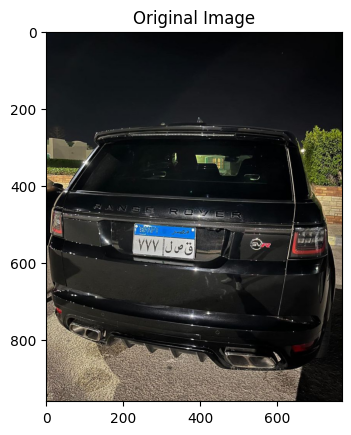

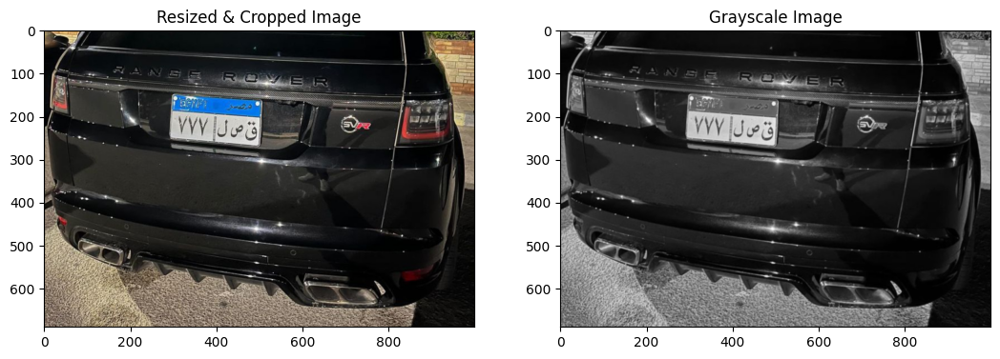

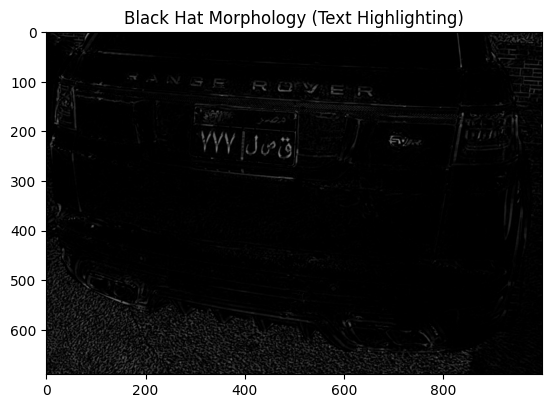

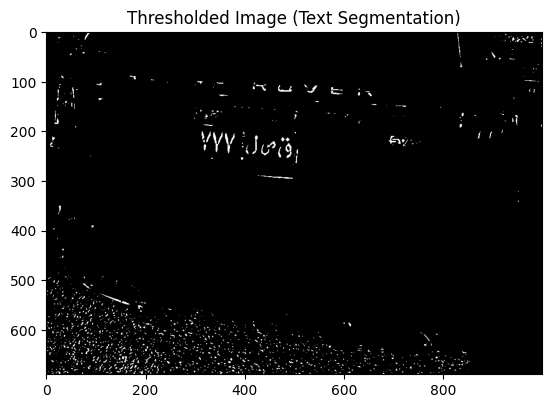

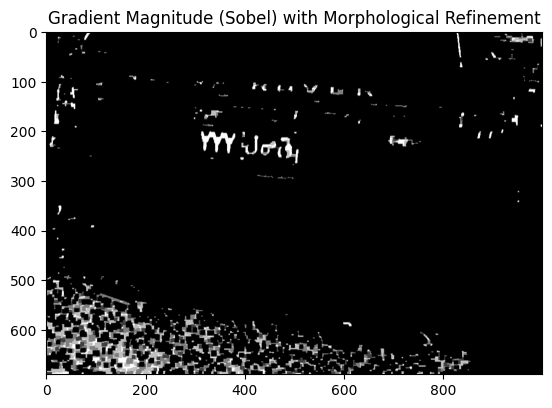

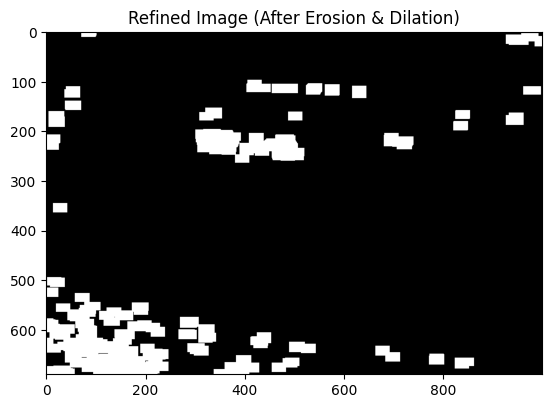

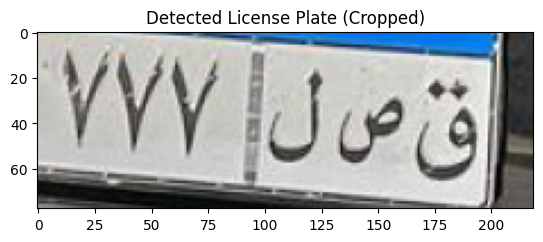

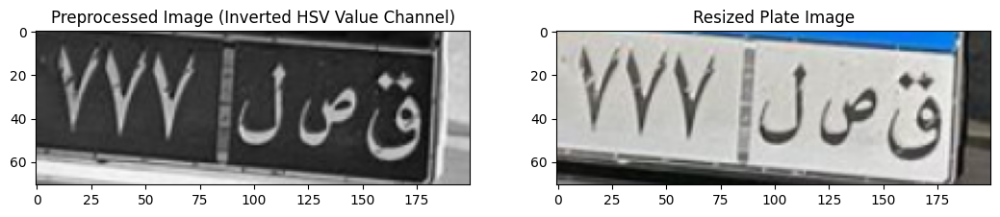

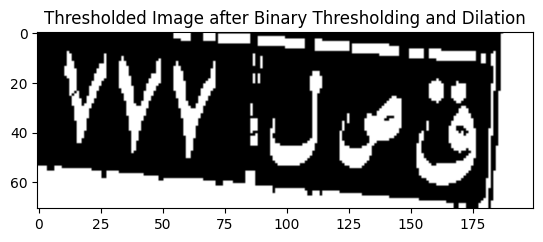

Connected Components: 30


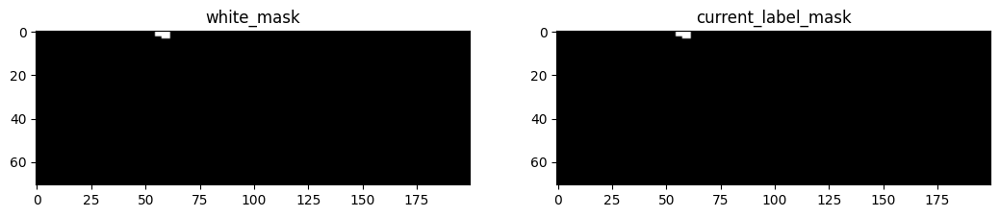

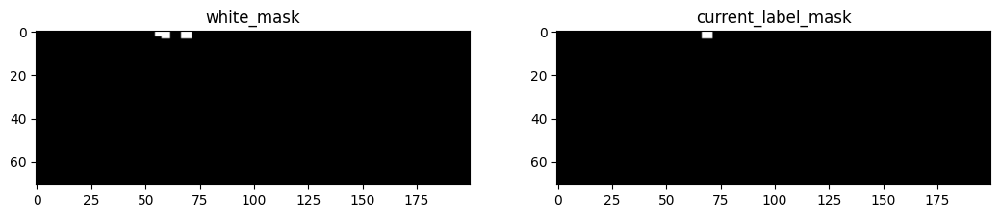

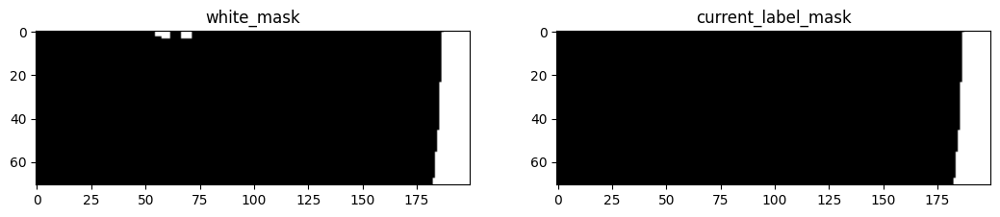

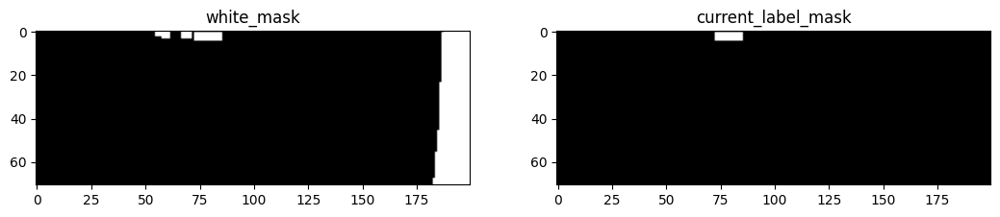

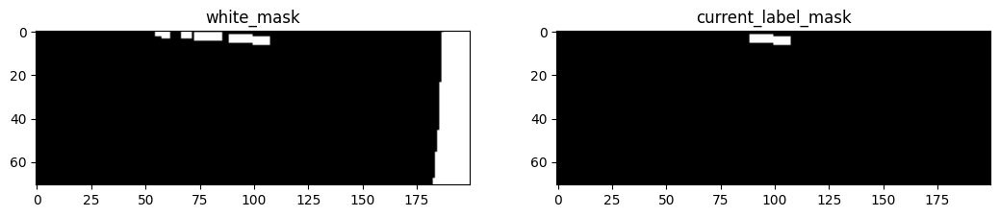

...

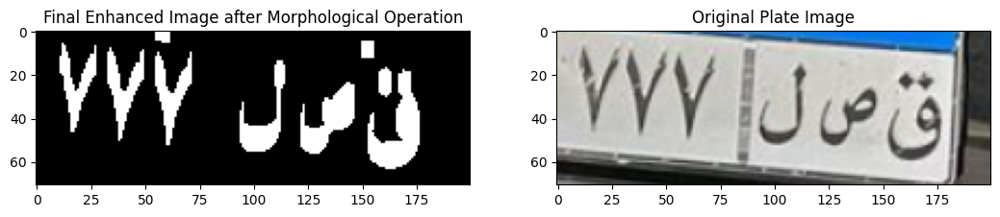

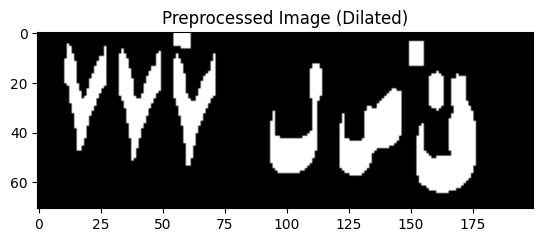

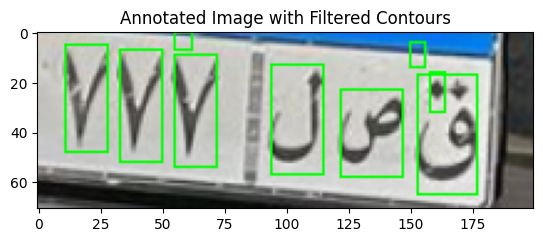

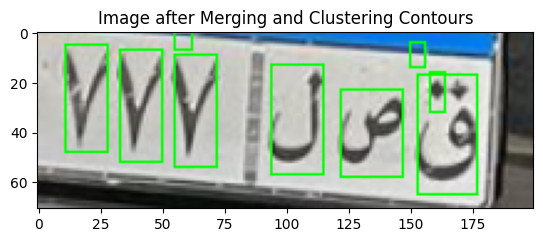

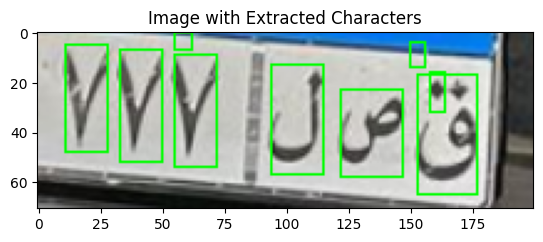

Is the plate valid? 1


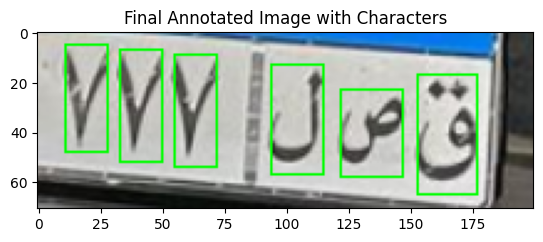

Extracted Characters: 6


In [ ]:
[car_plate, result] = run_all('car15.jpg')

Result:  ['qaf' 'sad' 'lam' '7' '7' '7']


array([[[200, 204, 203],
        [203, 206, 204],
        [202, 205, 202],
        ...,
        [ 61,  59,  50],
        [ 50,  54,  52],
        [ 45,  52,  54]],

       [[198, 203, 207],
        [190, 198, 201],
        [187, 196, 197],
        ...,
        [ 64,  62,  53],
        [ 56,  59,  56],
        [ 53,  59,  59]],

       [[197, 206, 213],
        [195, 205, 212],
        [192, 204, 209],
        ...,
        [ 63,  62,  52],
        [ 57,  59,  54],
        [ 54,  59,  57]],

       ...,

       [[ 84,  84,  84],
        [ 64,  64,  64],
        [ 62,  62,  62],
        ...,
        [ 85,  89,  94],
        [ 85,  89,  94],
        [ 86,  89,  94]],

       [[117, 117, 117],
        [119, 119, 119],
        [116, 116, 116],
        ...,
        [ 86,  90,  95],
        [ 87,  90,  95],
        [ 88,  91,  96]],

       [[133, 134, 134],
        [141, 141, 141],
        [139, 139, 139],
        ...,
        [ 86,  90,  94],
        [ 87,  90,  95],
        [ 88,  91,  96]]], dtype=uint8)
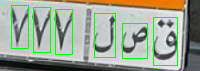

In [ ]:
print("Result: ", result)
car_plate

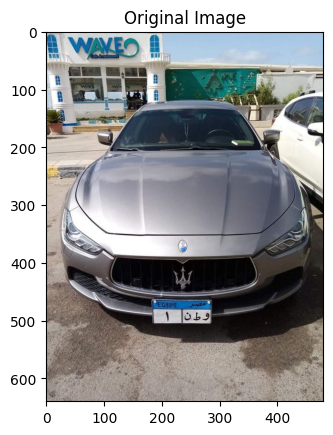

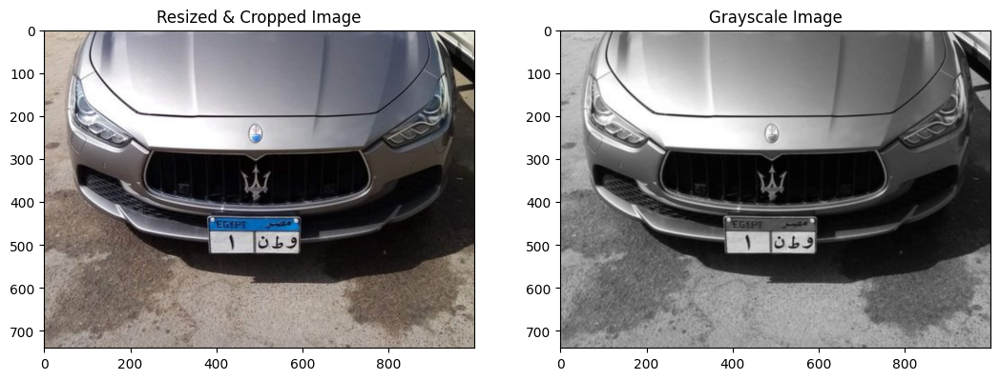

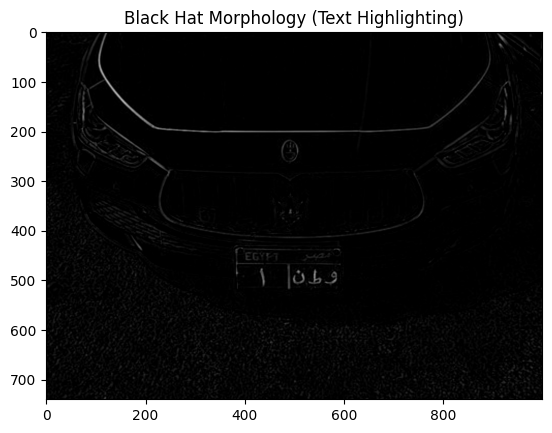

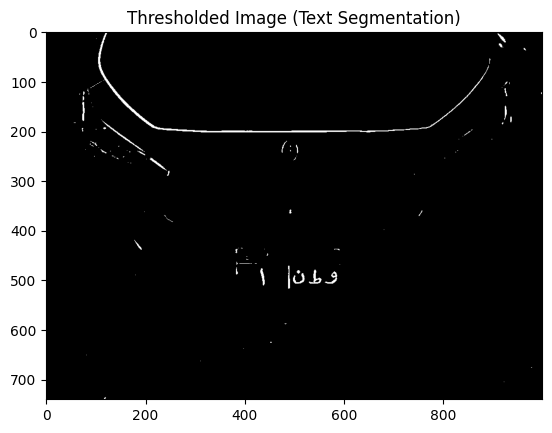

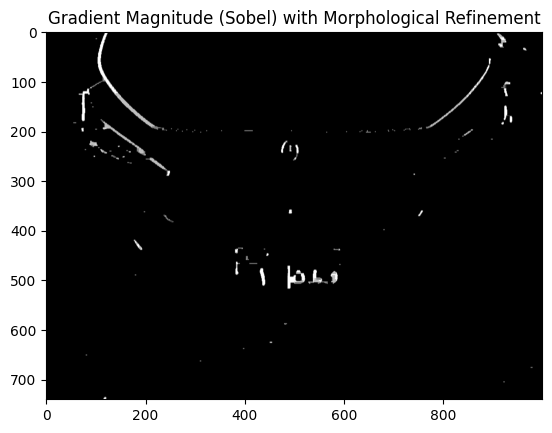

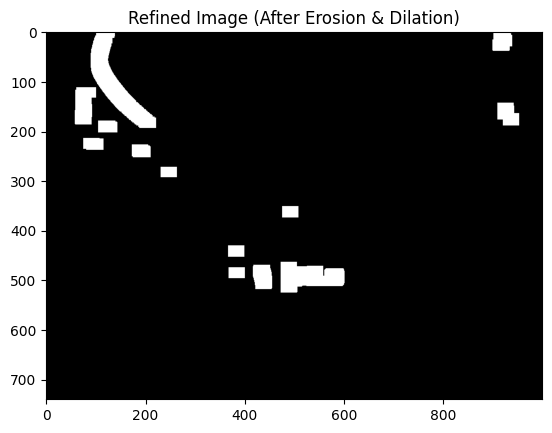

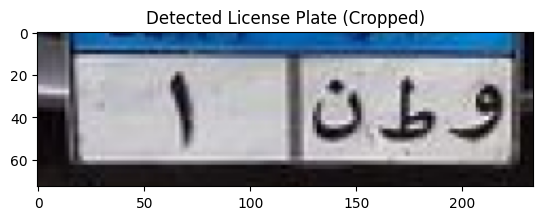

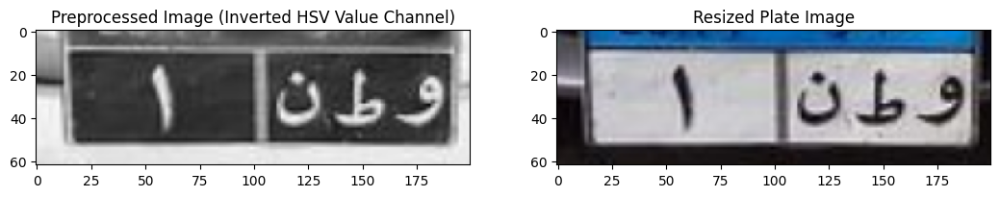

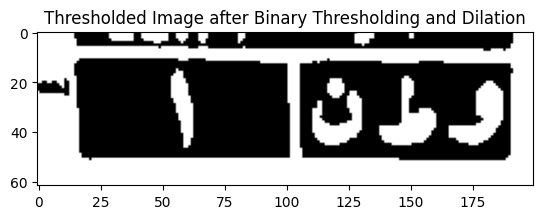

Connected Components: 13


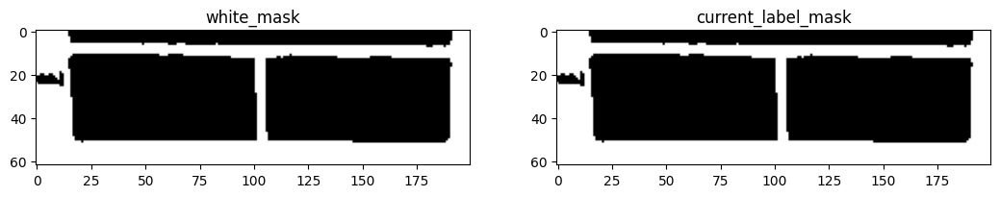

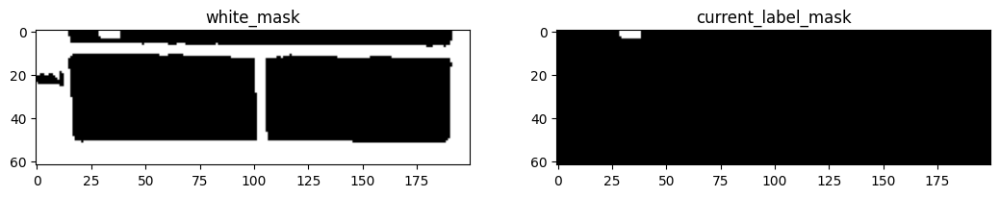

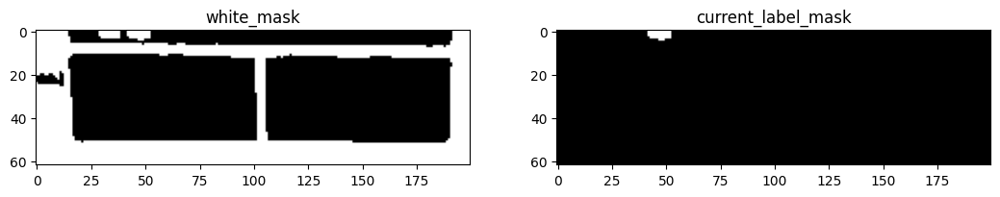

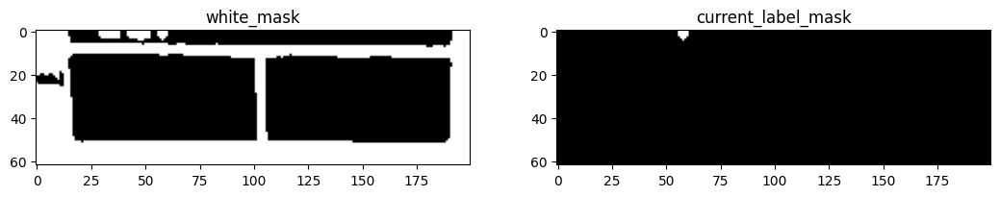

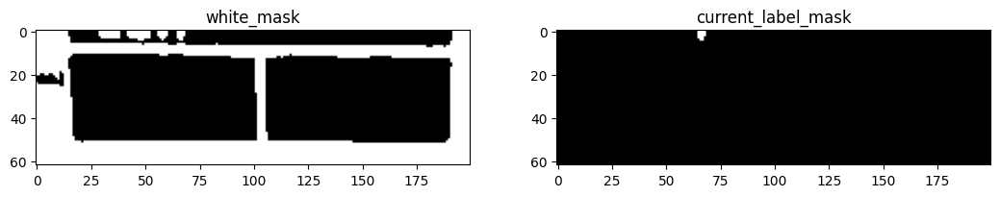

...

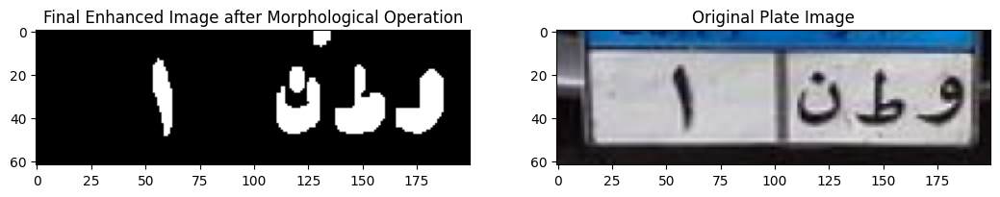

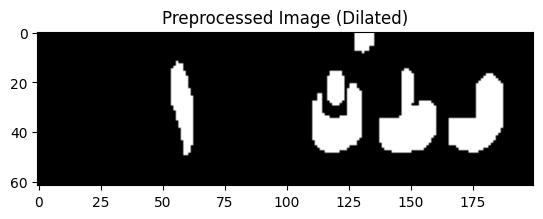

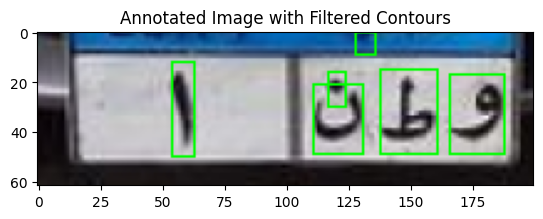

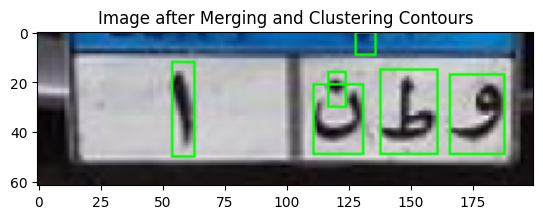

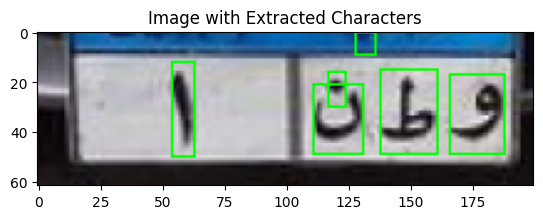

Is the plate valid? 1


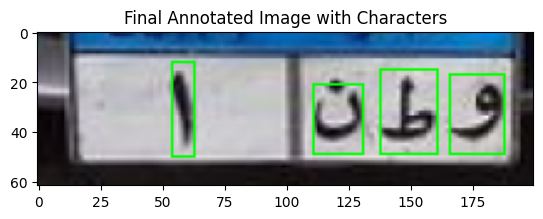

Extracted Characters: 4


In [ ]:
[car_plate, result] = run_all('test.jpeg')

Result:  ['waw' "ta'" 'noon' '1']


array([[[33, 26, 23],
        [35, 25, 24],
        [34, 21, 23],
        ...,
        [ 5,  3,  8],
        [10,  6,  9],
        [12,  7, 10]],

       [[49, 42, 37],
        [49, 40, 37],
        [46, 34, 34],
        ...,
        [ 5,  1,  6],
        [11,  6,  9],
        [13,  8, 10]],

       [[71, 65, 58],
        [71, 64, 58],
        [68, 58, 56],
        ...,
        [ 5,  1,  5],
        [12,  6,  9],
        [14,  8, 10]],

       ...,

       [[21, 21, 27],
        [23, 23, 29],
        [24, 24, 30],
        ...,
        [19, 18, 22],
        [18, 18, 22],
        [17, 18, 22]],

       [[23, 25, 30],
        [24, 26, 32],
        [25, 26, 32],
        ...,
        [17, 16, 20],
        [17, 18, 22],
        [18, 19, 23]],

       [[25, 28, 33],
        [26, 29, 34],
        [27, 28, 34],
        ...,
        [15, 14, 18],
        [18, 18, 22],
        [19, 20, 24]]], dtype=uint8)
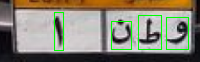

In [ ]:
print("Result: ", result)
car_plate

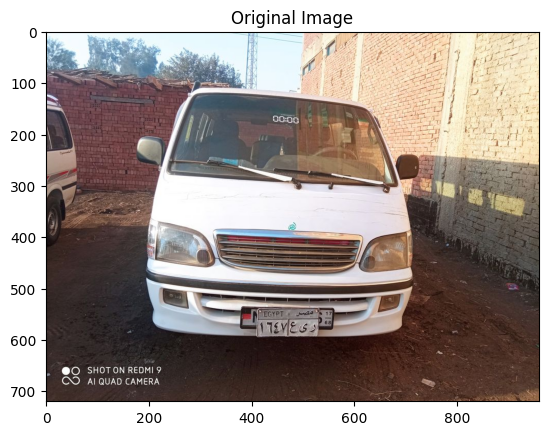

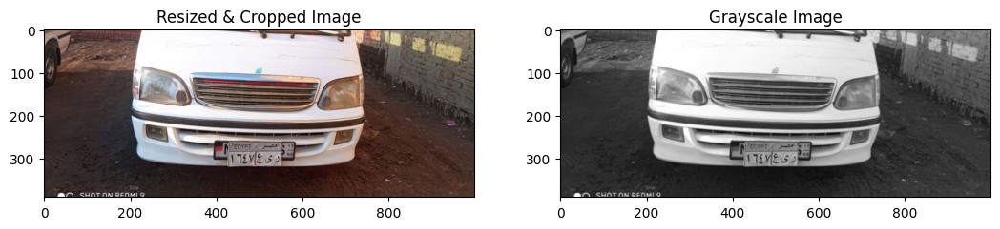

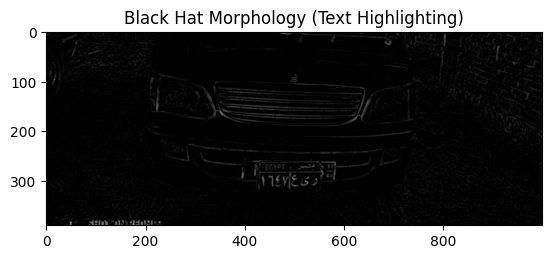

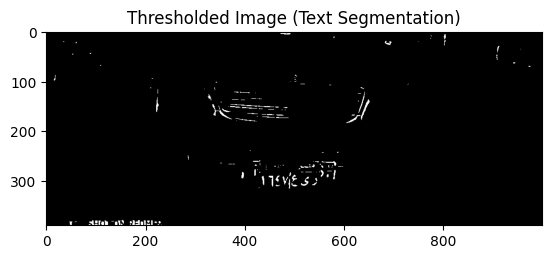

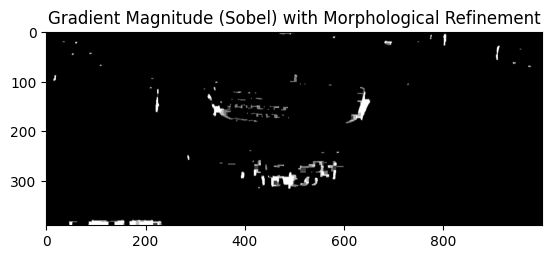

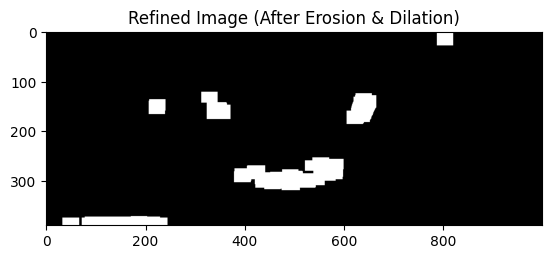

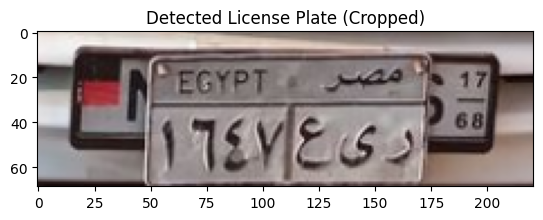

In [ ]:
car_plate = LPD('0021.jpg')

In [ ]:
import easyocr
import cv2 as cv
import matplotlib.pyplot as plt

reader = easyocr.Reader(['ar'])

img = car_plate
results = reader.readtext(img)

image_height = img.shape[0]

filtered_results = [
    result for result in results if result[0][0][1] > image_height / 3
]

sorted_results = sorted(filtered_results, key=lambda result: result[0][0][0])

for (bbox, text, prob) in sorted_results:
    print(f"Detected text: {text} with confidence {prob:.2f}")

    if prob > 0.4:
        (top_left, top_right, bottom_right, bottom_left) = bbox
        top_left = tuple(map(int, top_left))
        bottom_right = tuple(map(int, bottom_right))

        cv.rectangle(car_plate, top_left, bottom_right, (0, 255, 0), 2)

dnn_results = []

for result in sorted_results:
    detected_text = result[1]
    for char in detected_text:
        if char != " ":
          print(f'Detected Character: {char}')
          dnn_results.append(char)

# dnn_results = dnn_results[::-1]
print(dnn_results)



Detected text: رىع ٦٤٧ with confidence 0.76
Detected Character: ر
Detected Character: ى
Detected Character: ع
Detected Character:  
Detected Character: ٦
Detected Character: ٤
Detected Character: ٧
['٧', '٤', '٦', ' ', 'ع', 'ى', 'ر']


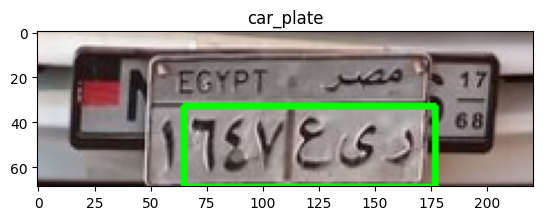

In [ ]:
show_images([car_plate], ["car_plate"])